In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import pennylane as qml

# Physics informed Quantum Neural Networks(PIQNNs)

This is first phase testing of quantum neural network for physics informed machine learning. We will be testing the usage of various quantum layers on a basic differential equation. 

$$\frac{dy}{dt} = cos(t) + sin(t)$$

inital condition

$$y(0) = -1 $$

analytical solution

$$y(t) = sin(t) - cos(t)$$

Let's define the loss function which will be used to get the loss due to differential equation and due to the inital condition. 

In [2]:
def ode_system(t, net):
    t = t.reshape(-1,1)
    t = tf.constant(t, dtype = tf.float32)
    t_0 = tf.zeros((1,1))
    one = tf.ones((1,1))

    with tf.GradientTape() as tape:
        tape.watch(t)

        u = net(t)
        u_t = tape.gradient(u, t)

    ode_loss = u_t - tf.math.cos(t) - tf.math.sin(t)
    IC_loss = net(t_0) - (-1)*one

    square_loss = tf.square(ode_loss) + tf.square(IC_loss)
    total_loss = tf.reduce_mean(square_loss)

    return total_loss

# Classical NN

In [3]:
NN = tf.keras.models.Sequential([
    tf.keras.layers.Input((1,)),
    tf.keras.layers.Dense(units = 32, activation = 'tanh'),
    tf.keras.layers.Dense(units = 16, activation = 'tanh'),
    tf.keras.layers.Dense(units = 2, activation = 'tanh'),
    tf.keras.layers.Dense(units = 1)
])

NN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                64        
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 2)                 34        
                                                                 
 dense_3 (Dense)             (None, 1)                 3         
                                                                 
Total params: 629 (2.46 KB)
Trainable params: 629 (2.46 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


0.011359705


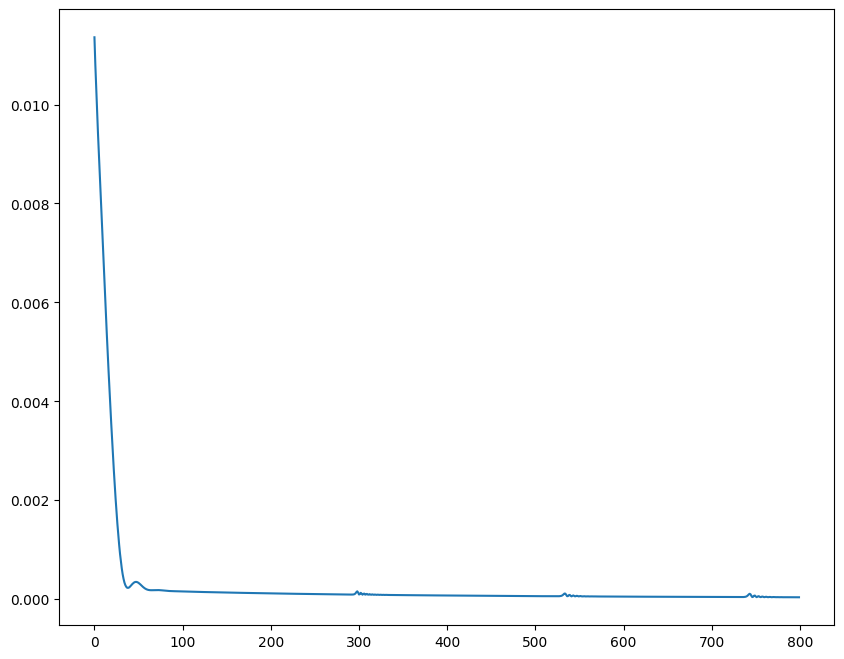

In [11]:
optm = tf.keras.optimizers.Adam(learning_rate = 0.001)

# 15 points are chosen on which the ode loss is calculated 
train_t = np.linspace(0,1,15)
train_loss_record = []

# the training loop for the classical case 
for itr in range(800):
    with tf.GradientTape() as tape:
        train_loss = ode_system(train_t, NN)
        train_loss_record.append(train_loss)

        grad_w = tape.gradient(train_loss, NN.trainable_variables)
        optm.apply_gradients(zip(grad_w, NN.trainable_variables))

    if itr % 1000 == 0:
        print(train_loss.numpy())

plt.figure(figsize = (10,8))
plt.plot(train_loss_record)
plt.show()

# Quantum Case NN

In [5]:
## define the quantum layer

def quantum_layer(n_layers, n_qubits):

    dev = qml.device("default.qubit", wires=n_qubits)
        
    @qml.qnode(dev)
    def qnode(inputs, weights):
        qml.AngleEmbedding(inputs, wires=range(n_qubits))
        n_layers = weights.shape[0]
        
        for i in range(0,n_layers):
            for j in range(0,n_qubits):
                qml.RY(weights[i,j],wires = j)
            for j in range(n_qubits - 1):
                qml.CNOT([j, j + 1])
            qml.CNOT([n_qubits - 1, 0])
        
        measures = [qml.expval(qml.PauliZ(wires=i)) for i in range(n_qubits)]

        return measures
    
    weight_shapes = {"weights": (2 * n_layers, n_qubits)}

    qlayer = qml.qnn.KerasLayer(qnode, weight_shapes, output_dim=n_qubits)

    return qlayer

In [6]:
qlayer = quantum_layer(3,2)

NNQ = tf.keras.models.Sequential([
    tf.keras.layers.Input((1,)),
    tf.keras.layers.Dense(units = 32, activation = 'tanh'),
    tf.keras.layers.Dense(units = 16, activation = 'tanh'),
    tf.keras.layers.Dense(units = 2, activation = 'tanh'),
    qlayer,
    tf.keras.layers.Dense(units = 1)
])

NNQ.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                64        
                                                                 
 dense_5 (Dense)             (None, 16)                528       
                                                                 
 dense_6 (Dense)             (None, 2)                 34        
                                                                 
 keras_layer (KerasLayer)    (None, 2)                 12        
                                                                 
 dense_7 (Dense)             (None, 1)                 3         
                                                                 
Total params: 641 (2.50 KB)
Trainable params: 641 (2.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


0.060376175


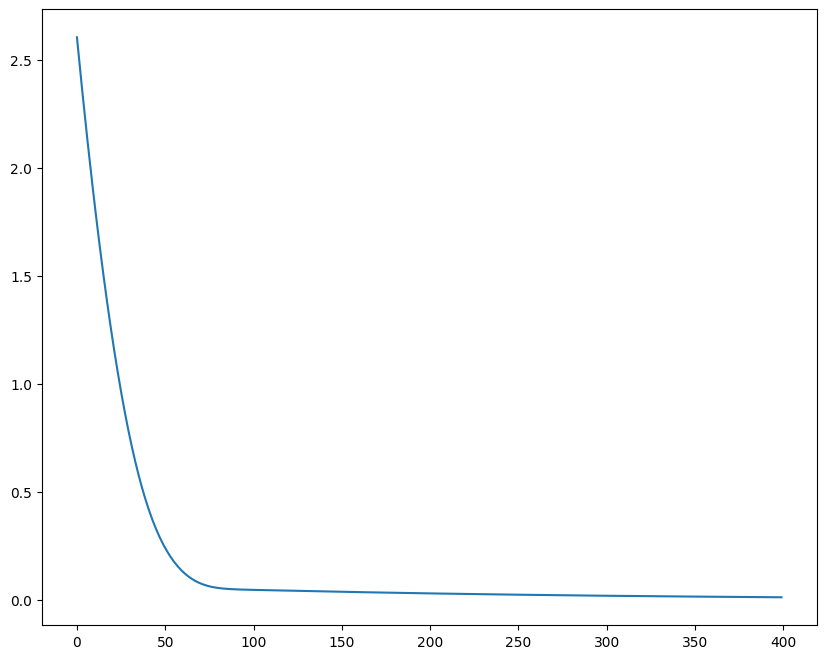

In [9]:
optm = tf.keras.optimizers.Adam(learning_rate = 0.001)

# 15 points are chosen on which the ode loss is calculated 
train_t = np.linspace(0,1,15)
train_loss_record_Q = []

# the training loop for the classical case 
for itr in range(800):
    with tf.GradientTape() as tape:
        train_loss = ode_system(train_t, NNQ)
        train_loss_record_Q.append(train_loss)

        grad_w = tape.gradient(train_loss, NNQ.trainable_variables)
        optm.apply_gradients(zip(grad_w, NNQ.trainable_variables))

    if itr % 1000 == 0:
        print(train_loss.numpy())

plt.figure(figsize = (10,8))
plt.plot(train_loss_record)
plt.show()

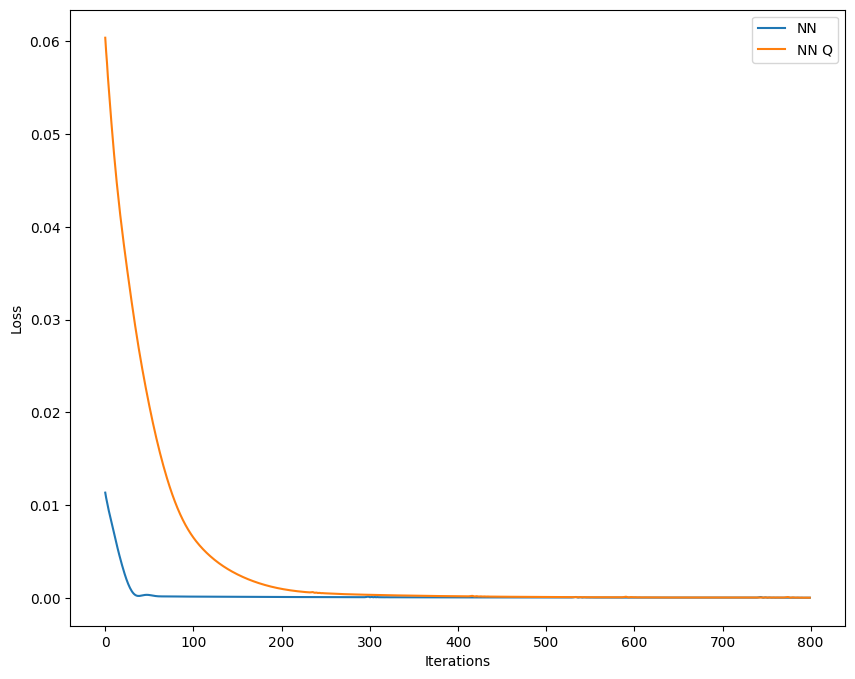

In [33]:
plt.figure(figsize = (10,8))
plt.plot(train_loss_record, label = 'NN')
plt.plot(train_loss_record_Q, label = 'NN Q')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [35]:
(pred_uq, pred_u)

(array([-0.99974346, -0.9453528 , -0.88838017, -0.82918787, -0.76779675,
        -0.7043309 , -0.6389588 , -0.57182074, -0.50303245, -0.43273196,
        -0.36113045, -0.2885235 , -0.2152529 , -0.14162496, -0.06782463,
         0.00613028,  0.08032775,  0.15476492,  0.22905108,  0.30212593],
       dtype=float32),
 array([-1.0000253 , -0.9463264 , -0.8897027 , -0.8303986 , -0.76868266,
        -0.7048307 , -0.63910955, -0.5717632 , -0.5030022 , -0.43300062,
        -0.36189845, -0.2898121 , -0.21684997, -0.14313231, -0.06881289,
         0.00590168,  0.08073688,  0.15534441,  0.22930498,  0.30214107],
       dtype=float32))

1/1 [==============================] - 0s 144ms/step


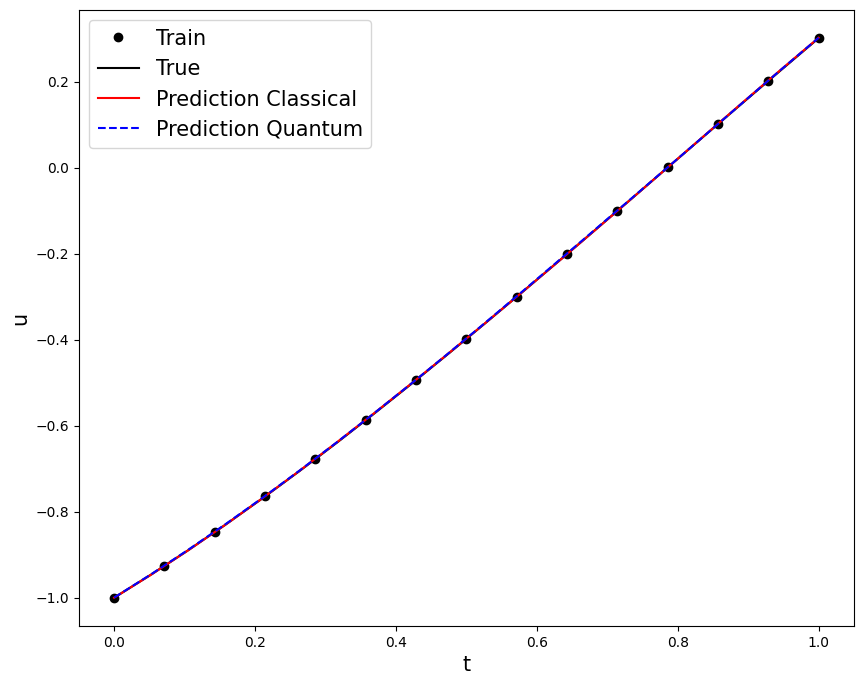

In [39]:
test_t = np.linspace(0, 1, 20)

train_u = np.sin(train_t)-np.cos(train_t)
true_u = np.sin(test_t)-np.cos(test_t)
pred_u = NN.predict(test_t).ravel()
pred_uq = NNQ.predict(test_t).ravel()

plt.figure(figsize = (10,8))
plt.plot(train_t, train_u, 'ok', label = 'Train') # basically this is the training samples
plt.plot(test_t, true_u, '-k',label = 'True') 
plt.plot(test_t, pred_u, '-r', label = 'Prediction Classical')
plt.plot(test_t, pred_uq, '--b', label = 'Prediction Quantum')
plt.legend(fontsize = 15)
plt.xlabel('t', fontsize = 15)
plt.ylabel('u', fontsize = 15)
plt.show()